In [13]:
%reload_ext autoreload
%autoreload 2

In [14]:
from lib import *
set_preconditions()

# Table 2

In [43]:
sizes = pickle.load(open(f'{DATA_PATH}/topview/sizes.pkl', 'rb'))
columns = [
    'Stage', 
    'Parent radius (mean, µm)', 
    'Parent radius (std, µm)', 
    'Offspring radius (mean, µm)', 
    'Offspring radius (std, µm)', 
    'Somatic cell radius (mean, µm)', 
    'Somatic cell radius (std, µm)'
]
data = []
for stage, stage_data in sizes.items():
    row = [
        stage,
        np.array(stage_data['Spheroid radii']).mean(),
        np.array(stage_data['Spheroid radii']).std(),
        np.array(stage_data['Offspring radii']).mean(),
        np.array(stage_data['Offspring radii']).std(),
        np.array(stage_data['Somatic cell radii']).mean(),
        np.array(stage_data['Somatic cell radii']).std(),
    ]
    data.append(row)

df = pd.DataFrame(data, columns=columns)
df = df.set_index('Stage')
n_avg_cells = 2000 # This is a standard count
n_avg_offspring = 13 # This has been estimated from data
df['Parent volume change (est., mm3)'] = ((4/3) * np.pi * df['Parent radius (mean, µm)'] ** 3)[:-1].diff()[1:] * 1e-9
df['Total offspring volume change (est., mm3)'] = (n_avg_offspring * (4/3) * np.pi * df['Offspring radius (mean, µm)'] ** 3)[:-1].diff()[1:] * 1e-9
df['Total cell volume change (est., µm3)'] = (n_avg_cells * (4/3) * np.pi * df['Somatic cell radius (mean, µm)'] ** 3)[:-1].diff()[1:]
df['Parent ECM volume change (est., mm3)'] = df['Parent volume change (est., mm3)'] - df['Total cell volume change (est., µm3)'] * 1e-9 - df['Total offspring volume change (est., mm3)']
df[r'\% spheroid volume change to offspring'] = 100 * df['Total offspring volume change (est., mm3)'] / df['Parent volume change (est., mm3)']
df[r'\% spheroid volume change to cells'] = 100 * 1e-9 * df['Total cell volume change (est., µm3)'] / df['Parent volume change (est., mm3)']
df['Elapsed'] = pd.Series(np.array([15, 6, 16], dtype=int), index=['II', 'III', 'IV'])
df['Spheroid growth rate (est., mm3/h)'] = df['Parent volume change (est., mm3)'] / df['Elapsed']
df['Total offspring growth rate (est., mm3/h)'] = (df['Total offspring volume change (est., mm3)'] / df['Elapsed']) 
df['Total cell volume growth rate (est., µm3/h)'] = (df['Total cell volume change (est., µm3)'] / n_avg_cells) / df['Elapsed']
df['Parent ECM growth rate (est., mm3/h)'] = (df['Parent ECM volume change (est., mm3)'] / df['Elapsed'])
# df = df.round(4)
df.to_csv(f'{ZENODO_PATH}/Table_2.csv', index=True)
df.to_csv(f'{ZENODO_PATH}/Table_S2.csv', index=True)
df


,"Parent radius (mean, µm)","Parent radius (std, µm)","Offspring radius (mean, µm)","Offspring radius (std, µm)","Somatic cell radius (mean, µm)","Somatic cell radius (std, µm)","Parent volume change (est., mm3)","Total offspring volume change (est., mm3)","Total cell volume change (est., µm3)","Parent ECM volume change (est., mm3)",\% spheroid volume change to offspring,\% spheroid volume change to cells,Elapsed,"Spheroid growth rate (est., mm3/h)","Total offspring growth rate (est., mm3/h)","Total cell volume growth rate (est., µm3/h)","Parent ECM growth rate (est., mm3/h)"
Stage,,,,,,,,,,,,,,,,,
I,106.351408,5.850970,15.832268,1.557830,2.752826,0.468484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
II,221.138099,19.297216,29.091342,1.601109,3.855145,0.391713,0.040259,0.001125,305234.238193,0.038830,2.793317,0.758170,15.0,0.002684,0.000075,10.174475,0.002589
III,243.600208,13.437090,30.396624,3.993302,3.964743,0.343051,0.015253,0.000189,42112.727067,0.015022,1.237002,0.276095,6.0,0.002542,0.000031,3.509394,0.002504
IV,422.481332,5.567769,79.485138,6.124708,4.154702,0.422844,0.255321,0.025816,78699.464588,0.229426,10.111346,0.030824,16.0,0.015958,0.001614,2.459358,0.014339
S,264.826342,26.451097,15.450968,1.105568,4.063457,0.318071,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Figure 8

Processing metric Cell area
Processing metric Compartment area
Processing metric Aspect ratio
Processing metric Circularity
Processing metric Offset
Processing metric Offset (whitened)
Processing metric Voronoi error
Saved uncompressed figure to ../zenodo/Figure_8/PhII_figure8.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_8/PhII_figure8.pdf
Saved figure to ../zenodo/Figure_8/PhII_figure8.pdf


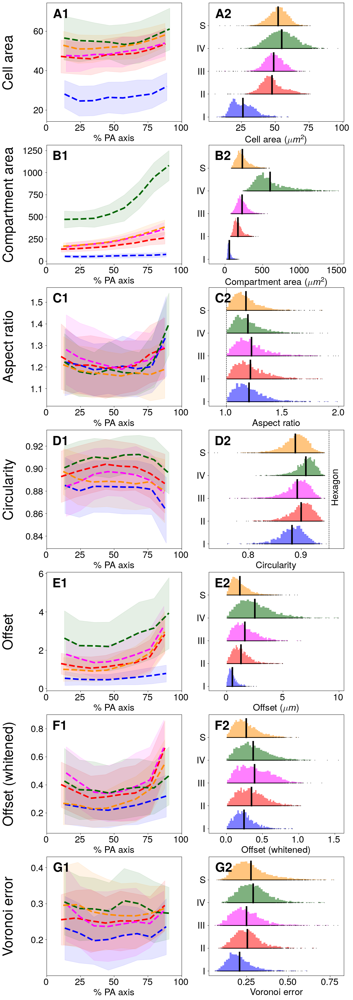

In [16]:
from plot_metrics import *

orientation = 'vertical'
layout, fig, axs, datasource = make_ap_fig([
    ('Cell area', 'Cell AP value'), 
    ('Compartment area', 'Compartment AP value'), 
    ('Aspect ratio', 'Compartment AP value'), 
    ('Circularity', 'Compartment AP value'), 
    ('Offset', 'Compartment AP value'), 
    ('Offset (whitened)', 'Compartment AP value'), 
    ('Voronoi error', 'Compartment AP value')], 
ap_mode='binned', fmult=1.5, orientation=orientation)
# Draw lines for 5/6 gons ID
layout = np.array(layout).T if orientation == 'vertical' else layout
axk = layout[1][3]
for n, name in [(6, 'Hexagon')]:
    n_ir = PlanarPolygon.ir_ngon(n)
    axs[axk].axvline(n_ir, color='k', linestyle='--', linewidth=ind_lw)
    axs[axk].text(n_ir*1.005, 2.5, name, fontsize=title_fs*1.1, ha='left', va='center', rotation=90)
axs[layout[1][2]].axvline(1, color='k', linestyle='--', linewidth=ind_lw)
# pad_top_ax(axs[layout[0][0]])
# pad_top_ax(axs[layout[0][-1]])
pad_left_ax(axs[layout[1][1]])
pad_left_ax(axs[layout[1][2]])
pad_right_ax(axs[layout[1][3]])
pad_left_ax(axs[layout[1][4]])
# pad_left_ax(axs[layout[1][4]])
pad_left_ax(axs[layout[1][5]])
fig.subplots_adjust(hspace=0.2, wspace=0.2, top=1.5, right=1.1)
# plt.show()
# save_fig(fig, 'Fig_cam_ap_dist', exts=['png'])
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_8/PhII_figure8', exts=['pdf'], dpi=200, compressed_dpi=200, autorasterize=True)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_8/PhII_figure8_data.csv', index=False)
fig

## Figure S10

Processing metric Offset angle
Processing metric Voronoi neighbors
Saved uncompressed figure to ../zenodo/Figure_S10/PhII_figureS10.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S10/PhII_figureS10.pdf
Saved figure to ../zenodo/Figure_S10/PhII_figureS10.pdf


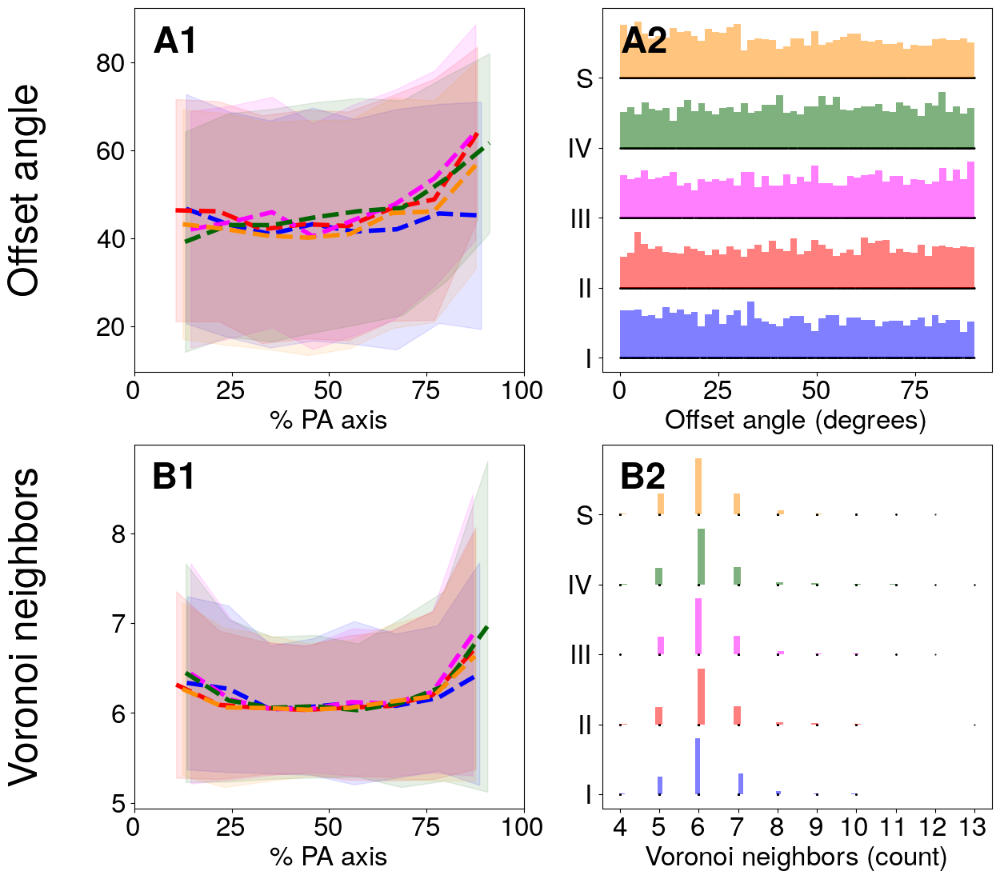

In [22]:
from plot_metrics import *
orientation = 'vertical'
layout, fig, axs, datasource = make_ap_fig([
    ('Offset angle', 'Cell AP value'),
    ('Voronoi neighbors', 'Compartment AP value')
], ap_mode='binned', fmult=1.5, orientation=orientation, means=False)
fig.subplots_adjust(hspace=0.2, wspace=0.2, top=1.5, right=1.1)
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_S10/PhII_figureS10', exts=['pdf'], dpi=150, autorasterize=True)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_S10/PhII_figureS10_data.csv', index=False)
fig

## Table S1

In [46]:
from compute_polygon_metrics import iterate_over_stage_metrics
dfs = []
def fun(stage: str, df: pd.DataFrame):
    df = df.groupby(['Spheroid', 'Stage']).size().reset_index(name='Segmented cell-compartment pairs')
    dfs.append(df)
iterate_over_stage_metrics(fun, '')
df = pd.concat(dfs)
metrics_df = pd.read_csv(f'{DATA_PATH}/topview/all_spheroid_metrics.csv')
# Assert we are doing a one-to-one join
for df_ in [df, metrics_df]:
    assert len(df_) == len(df_.drop_duplicates(['Spheroid', 'Stage'])), "Error: Join is not one-to-one!"
assert len(df) == len(metrics_df), "Error: Join is not one-to-one!"
df = df.merge(
    metrics_df[['Spheroid', 'Stage', 'Spheroid circular radius']],
    left_on=['Spheroid', 'Stage'],
    right_on=['Spheroid', 'Stage'],
    how='inner'
)
df['Spheroid circular radius'] = df['Spheroid circular radius'].round().astype(int)
df = df[['Stage', 'Spheroid', 'Spheroid circular radius', 'Segmented cell-compartment pairs']]
df.to_csv(f'{ZENODO_PATH}/Table_S1.csv', index=False)
df

,Stage,Spheroid,Spheroid circular radius,Segmented cell-compartment pairs
0,I,1,96,152
1,I,2,107,317
2,I,3,104,267
3,I,4,109,260
4,I,5,103,265
5,I,6,117,249
6,I,7,108,248
7,II,1,188,397
8,II,2,230,494
9,II,3,221,548


# Figure S5

Saved uncompressed figure to ../zenodo/Figure_S5/PhII_figureS5_new.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S5/PhII_figureS5_new.pdf
Saved figure to ../zenodo/Figure_S5/PhII_figureS5_new.pdf


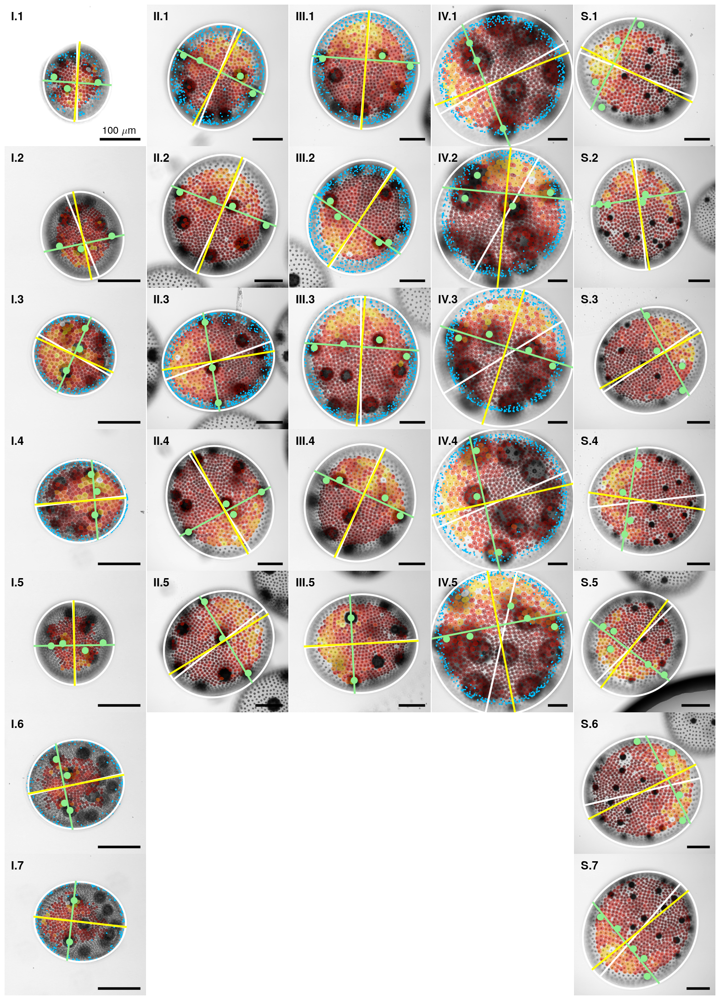

In [26]:
from plot_spheroids import plot_segmentations
fig, axs = plot_segmentations()
save_fig(fig, f'{ZENODO_PATH}/Figure_S5/PhII_figureS5_new', exts=['pdf'], dpi=150, compressed_dpi=150, jpeg_quality=85)
fig

# Figure S6

Saved uncompressed figure to ../zenodo/Figure_S6/PhII_figureS6_new.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S6/PhII_figureS6_new.pdf
Saved figure to ../zenodo/Figure_S6/PhII_figureS6_new.pdf


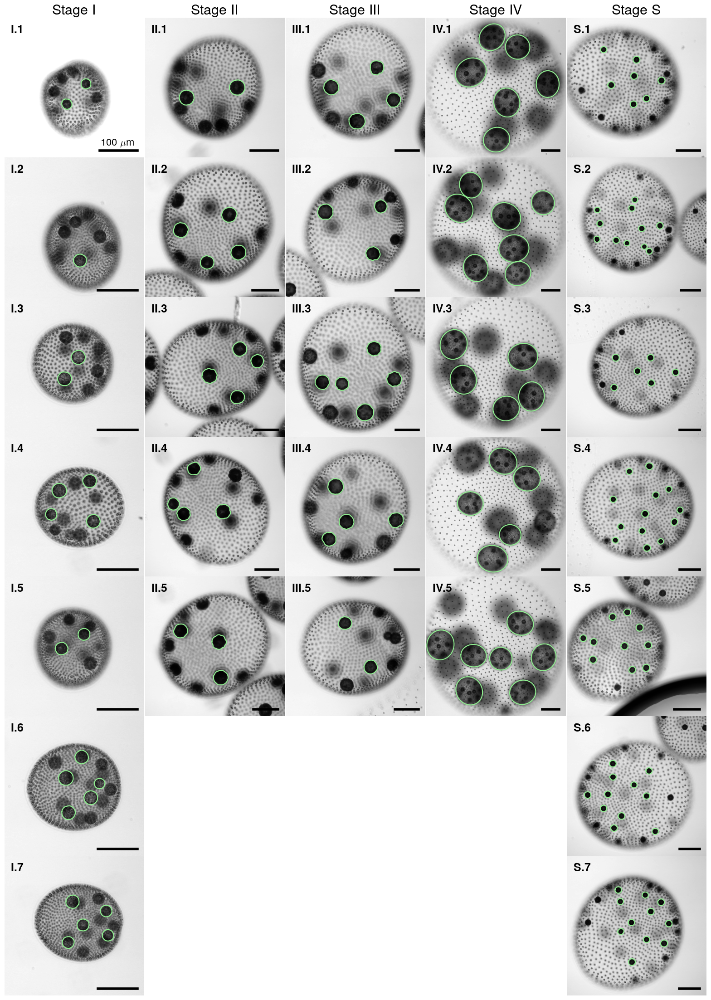

In [27]:
from plot_spheroids import plot_offspring_segmentations
fig, axs = plot_offspring_segmentations()
save_fig(fig, f'{ZENODO_PATH}/Figure_S6/PhII_figureS6_new', exts=['pdf'], dpi=100, compressed_dpi=100, jpeg_quality=85)
fig

# Figure S15

Processing metric Compartment area
Processing metric Aspect ratio
Processing metric Circularity
Saved uncompressed figure to ../zenodo/Figure_S15/PhII_figureS15.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S15/PhII_figureS15.pdf
Saved figure to ../zenodo/Figure_S15/PhII_figureS15.pdf


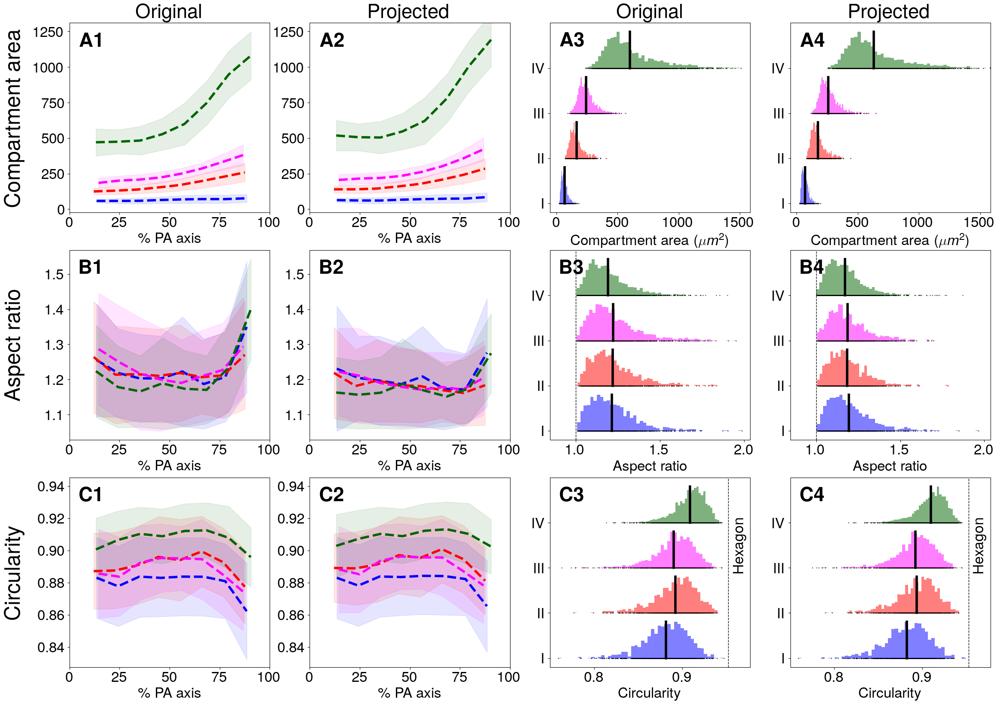

In [29]:
layout, fig, axs, datasource = make_projected_ap_fig([
    ('Compartment area', 'Compartment AP value'), 
    ('Aspect ratio', 'Compartment AP value'), 
    ('Circularity', 'Compartment AP value'), 
], fmult=1.5)
for j in [2, 3]:
    axk = layout[2][j]
    # Draw lines for 5/6 gons ID
    for n, name in [(6, 'Hexagon')]:
        n_ir = PlanarPolygon.ir_ngon(n)
        axs[axk].axvline(n_ir, color='k', linestyle='--', linewidth=ind_lw)
        axs[axk].text(n_ir*1.005, 2.5, name, fontsize=title_fs*1.1, ha='left', va='center', rotation=90)
    # Draw line for 1:1 aspect ratio
    axs[layout[1][j]].axvline(1, color='k', linestyle='--', linewidth=ind_lw)
for j in [0, 1]:
    pad_top_ax(axs[layout[2][j]])
for j in [2, 3]:
    pad_left_ax(axs[layout[1][j]])
    pad_right_ax(axs[layout[2][j]])
fig.subplots_adjust(hspace=0.2, wspace=0.2, top=1.5, right=1.1)
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_S15/PhII_figureS15', exts=['pdf'], dpi=200, compressed_dpi=200, autorasterize=True)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_S15/PhII_figureS15_data.csv', index=False)
fig

# Table S5

In [30]:
from compute_projected_metrics import iterate_over_stage_metrics_projected
metrics = ['Compartment area', 'Aspect ratio', 'Circularity']
df = {'Stage': []}
for metric in metrics:
    units = all_metrics[metric].units
    df[f'{metric} (original) ({units})'] = []
    df[f'{metric} (projected) ({units})'] = []

def fun(stage: str, df_raw: pd.DataFrame, df_proj: pd.DataFrame):
    df['Stage'].append(stage)
    for metric in metrics:
        units = all_metrics[metric].units
        df[f'{metric} (original) ({units})'].append(round(df_raw[metric].mean(), 2))
        df[f'{metric} (projected) ({units})'].append(round(df_proj[metric].mean(), 2))

iterate_over_stage_metrics_projected(fun)
df = pd.DataFrame(df)
df = df.set_index('Stage')
df.to_csv(f'{ZENODO_PATH}/Table_S5.csv', index=True)
df

,Compartment area (original) ($\mu m^2$),Compartment area (projected) ($\mu m^2$),Aspect ratio (original) (unitless),Aspect ratio (projected) (unitless),Circularity (original) (unitless),Circularity (projected) (unitless)
Stage,,,,,,
I,65.69,68.53,1.22,1.20,0.88,0.88
II,164.56,174.71,1.22,1.18,0.89,0.89
III,244.12,259.56,1.22,1.19,0.89,0.89
IV,600.21,632.07,1.19,1.17,0.91,0.91


In [8]:
(df['Compartment area (projected) ($\\mu m^2$)'] / df['Compartment area (original) ($\\mu m^2$)'] - 1) * 100

0    4.323337
1    6.167963
2    6.324758
3    5.308142
dtype: float64

# Figure 9

Saved uncompressed figure to ../zenodo/Figure_9/PhII_figure9.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_9/PhII_figure9.pdf
Saved figure to ../zenodo/Figure_9/PhII_figure9.pdf


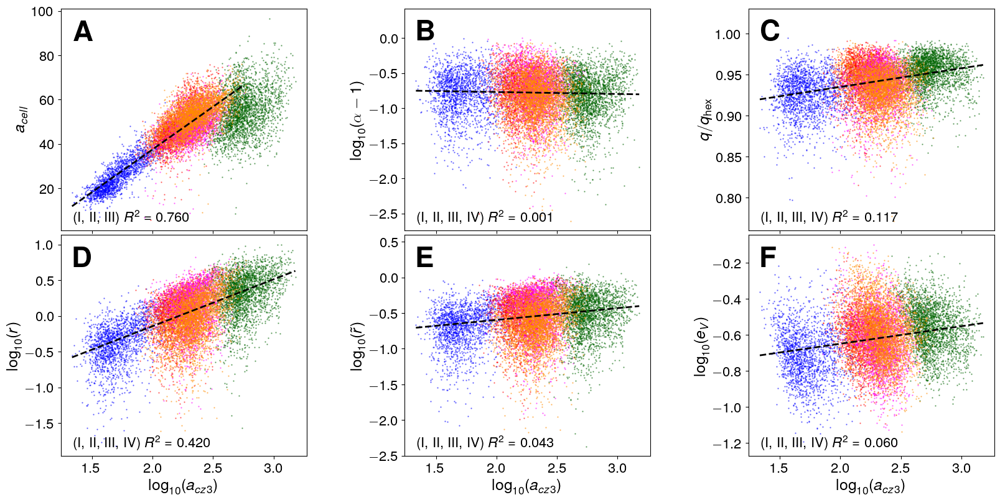

In [20]:
from plot_metrics import make_corr_fig
metrics = [
    [('Compartment area', 'Cell area', ['I','II','III']), ('Compartment area', 'Aspect ratio', ['I','II','III','IV']), ('Compartment area', 'Circularity', ['I','II','III', 'IV'])],
    [('Compartment area', 'Offset', ['I','II','III','IV']), ('Compartment area', 'Offset (whitened)', ['I','II','III','IV']), ('Compartment area', 'Voronoi error', ['I','II','III','IV'])],
]
layout, fig, axs, datasource = make_corr_fig(metrics)
fig.subplots_adjust(left=0., right=1., bottom=0.05, top=0.95, wspace=0.4, hspace=0.02)
pad_top_ax(axs[layout[0][1]])
pad_top_ax(axs[layout[0][2]])
pad_top_ax(axs[layout[1][1]])
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_9/PhII_figure9', exts=['pdf'], dpi=100, compressed_dpi=100, jpeg_quality=100)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_9/PhII_figure9_data.csv', index=False)
fig

# Figure S16

Saved uncompressed figure to ../zenodo/Figure_S16/PhII_figureS16.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S16/PhII_figureS16.pdf
Saved figure to ../zenodo/Figure_S16/PhII_figureS16.pdf


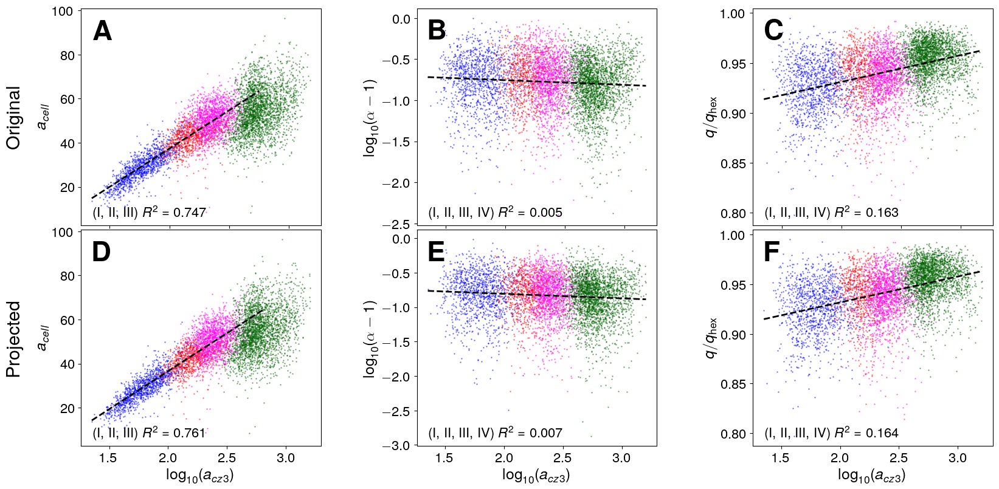

In [23]:
from plot_metrics import make_projected_corr_fig
metrics = [('Compartment area', 'Cell area', ['I','II','III']), ('Compartment area', 'Aspect ratio', ['I','II','III','IV']), ('Compartment area', 'Circularity', ['I','II','III', 'IV'])]
layout, fig, axs, datasource = make_projected_corr_fig(metrics, raw_metrics_override=['Cell area'])
fig.subplots_adjust(left=0., right=1., bottom=0.05, top=0.95, wspace=0.4, hspace=0.02)
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_S16/PhII_figureS16', exts=['pdf'], dpi=100, compressed_dpi=100, jpeg_quality=100)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_S16/PhII_figureS16_data.csv', index=False)
fig

## Figure 10

Saved uncompressed figure to ../zenodo/Figure_10/PhII_figure10.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_10/PhII_figure10.pdf
Saved figure to ../zenodo/Figure_10/PhII_figure10.pdf


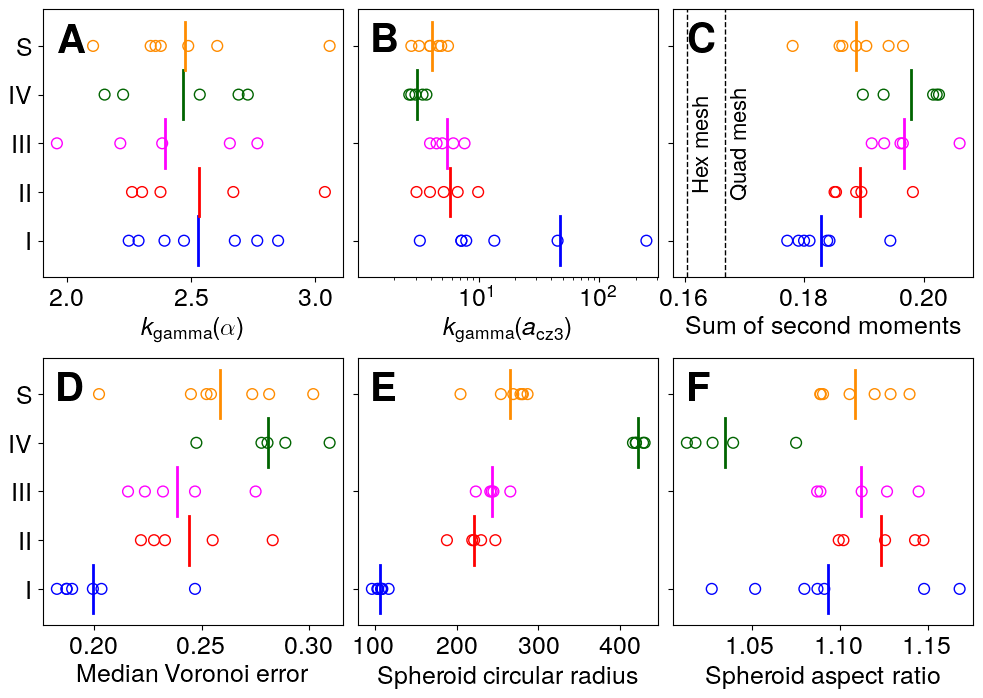

In [24]:
from plot_metrics import plot_spheroid_metrics
metrics = [r'$k_{\rm gamma}(\alpha)$', r'$k_{\rm gamma}(a_{\rm cz3})$', r'Sum of second moments', 'Median Voronoi error', 'Spheroid circular radius', 'Spheroid aspect ratio']
fig, axs, layout, datasource = plot_spheroid_metrics(metrics, ncols=3)
# Draw vertical line at QE for n-cell tessellations
for n, name in zip([6, 4], ['Hex', 'Quad']):
    n_eq = PlanarPolygon.trace_M2_ngon(n)
    axs[layout[0][2]].axvline(n_eq, color='k', linestyle='--', linewidth=ind_lw)
    axs[layout[0][2]].text(n_eq*1.005, 2, f'{name} mesh', fontsize=ticks_fs, ha='left', va='center', rotation=90)
pad_left_ax(axs[layout[0][1]], 0.15)
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_10/PhII_figure10', exts=['pdf'], dpi=100, compressed_dpi=100, jpeg_quality=100)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_10/PhII_figure10_data.csv', index=False)
fig

## Figure S11

Saved uncompressed figure to ../zenodo/Figure_S11/PhII_figureS11.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S11/PhII_figureS11.pdf
Saved figure to ../zenodo/Figure_S11/PhII_figureS11.pdf


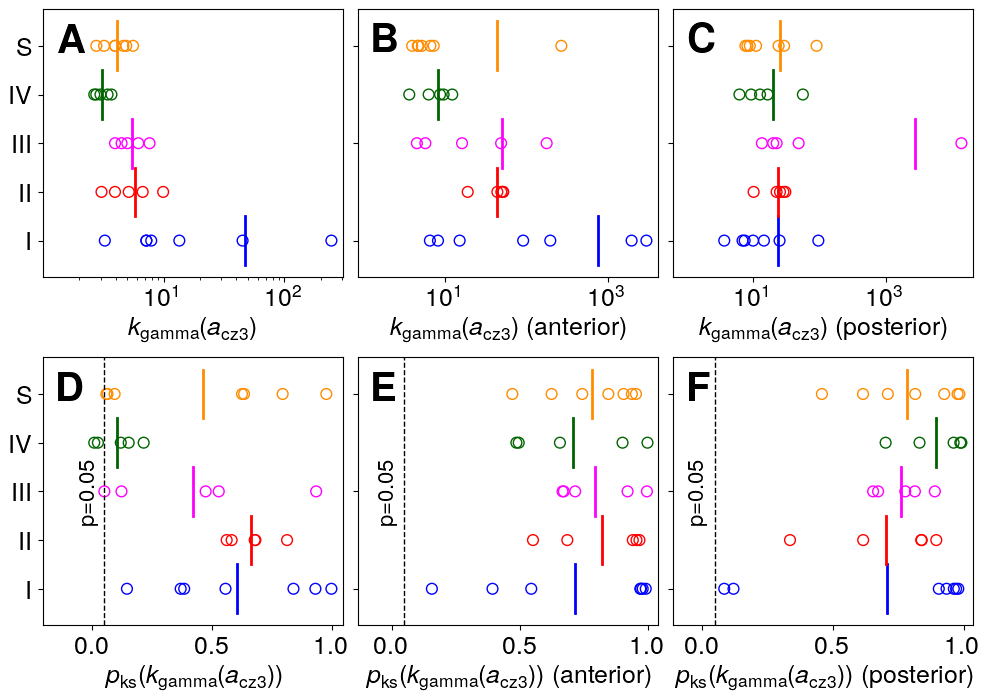

In [24]:
from plot_metrics import plot_spheroid_metrics

metrics = [
    r'$k_{\rm gamma}(a_{\rm cz3})$', r'$k_{\rm gamma}(a_{\rm cz3})$ (anterior)', r'$k_{\rm gamma}(a_{\rm cz3})$ (posterior)',
    r'$p_{\rm ks} (k_{\rm gamma}(a_{\rm cz3}))$', r'$p_{\rm ks} (k_{\rm gamma}(a_{\rm cz3}))$ (anterior)', r'$p_{\rm ks} (k_{\rm gamma}(a_{\rm cz3}))$ (posterior)'
]
fig, axs, layout, datasource = plot_spheroid_metrics(metrics, ncols=3)
for ax in axs.values():
    pad_left_ax(ax, 0.15)
for axk in [layout[1][j] for j in range(3)]:
    axs[axk].axvline(0.05, color='k', linestyle='--', linewidth=ind_lw)
    axs[axk].text(-0.02, 2, f'p={0.05}', fontsize=ticks_fs, ha='center', va='center', rotation=90)
pad_left_ax(axs[layout[1][1]], 0.1)
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_S11/PhII_figureS11', exts=['pdf'], dpi=150, compressed_dpi=150, autorasterize=False)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_S11/PhII_figureS11_data.csv', index=False)
fig

# Figure S17

/Users/asrvsn/dev/phd/asrvsn_mpl/src/asrvsn_mpl/base.py:72: UserWarning: Rasterization of '<mpl_toolkits.mplot3d.art3d.Path3DCollection object at 0x358e5e560>' will be ignored
  child.set_rasterized(True)


Saved uncompressed figure to ../figures/PhII_figureS17.uncompressed.pdf
Saved compressed figure to ../figures/PhII_figureS17.pdf
Trimmed figure to ../figures/PhII_figureS17.pdf
Saved figure to ../figures/PhII_figureS17.pdf


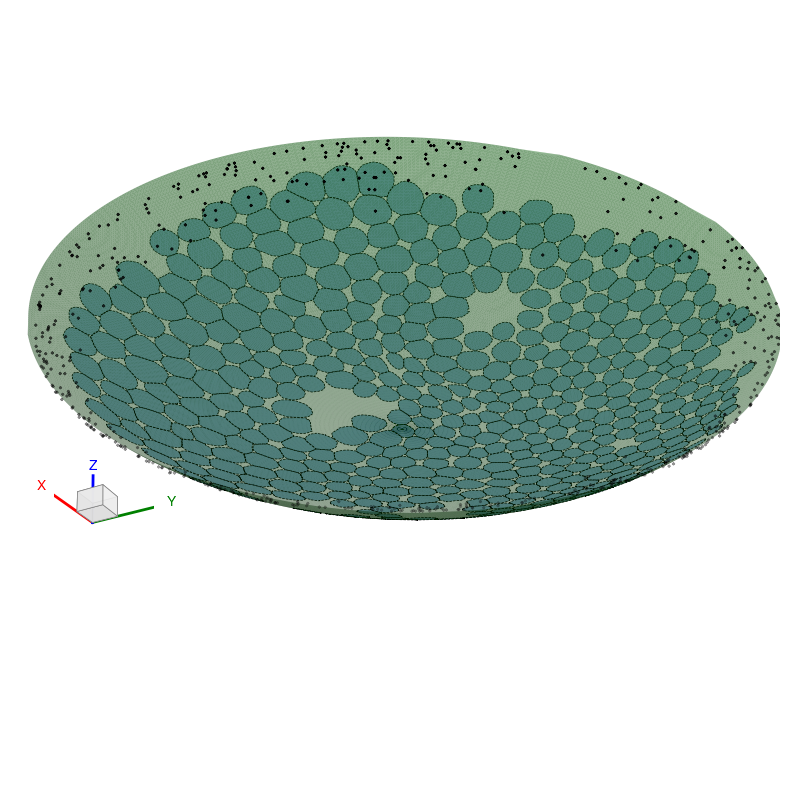

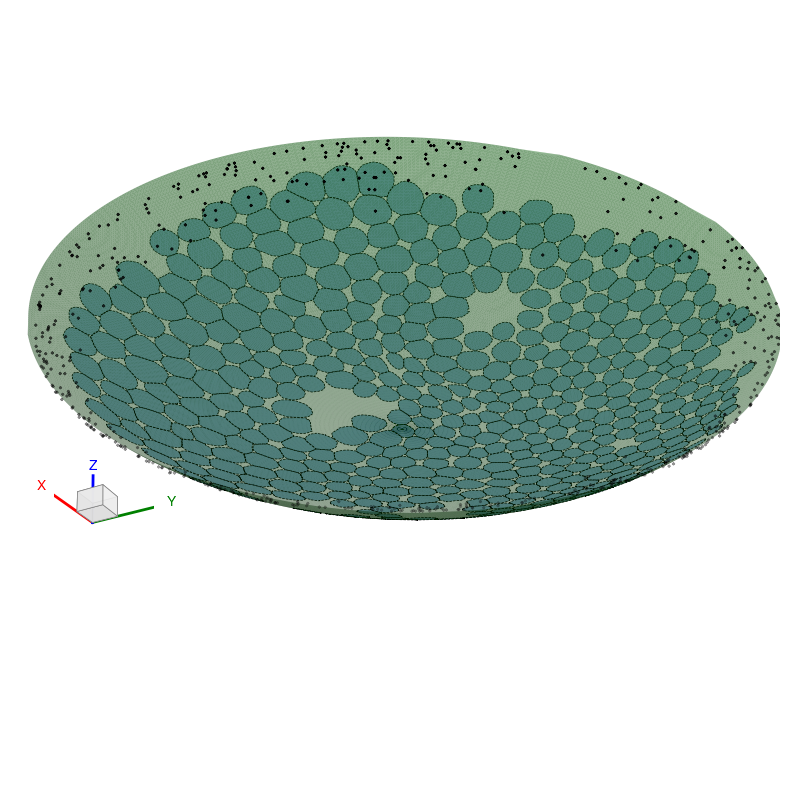

In [4]:
from mpl_toolkits.mplot3d import Axes3D
from project_compartments import render_projection
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
render_projection(ax, 'IV', 2)
ax.figure.set_size_inches((10, 10))
save_fig(fig, f'{FIGS_PATH}/PhII_figureS17', exts=['pdf'], dpi=150, compressed_dpi=150, jpeg_quality=100, trim="3 57 -1 25")
fig

# Table S4

In [31]:
paths = [
    '../data/crosssection/I/C1-Image012.tif',
    '../data/crosssection/II/C1-Image019.tif',
    '../data/crosssection/III/C1-Image009.tif',
    '../data/crosssection/IV/C1-Image014.tif',
]
voxsizes = [
    get_voxel_size(path, fmt='XY') for path in paths
]
polygons = [
    [r.roi.rescale(voxsize) for r in flatten_list(pickle.load(open(f'{os.path.splitext(path)[0]}.polygons', 'rb')))]
    for path, voxsize in zip(paths, voxsizes)
]
elongations = ['Radial', 'Radial', 'Radial', 'Tangential']
data = {
    'Stage': ['I', 'II', 'III', 'IV'],
    'Time (h)': [0, 15, 21, 37],
    'Cross-sectional major axis length (µm)': [round(np.array([p.elliptic_radii()[1]*2 for p in ps]).mean(), 2) for ps in polygons],
    'Cross-sectional minor axis length (µm)': [round(np.array([p.elliptic_radii()[0]*2 for p in ps]).mean(), 2) for ps in polygons],
    'Cross-sectional area (µm²)': [round(np.array([p.area() for p in ps]).mean(), 2) for ps in polygons],
    'Cross-sectional aspect ratio': [round(np.array([
        p.aspect_ratio()**(1 if el == 'Radial' else -1) for p in ps
    ]).mean(), 2) for ps, el in zip(polygons, elongations)],
    'Cross-sectional elongation': elongations,
    'Ellipsoidal est. volume (µm³)': [round(np.array([
        Ellipse.from_poly(p).revolve(0 if el == 'Radial' else 1).volume() # Revolve minor axis if radially oriented else major axis
    for p in ps]).mean(), 2) for ps, el in zip(polygons, elongations)],
}
df = pd.DataFrame(data)
# df.to_csv(f'{DATA_PATH}/crosssection/metrics.csv', index=False)
df.to_csv(f'{ZENODO_PATH}/Table_S4.csv', index=False)
df


,Stage,Time (h),Cross-sectional major axis length (µm),Cross-sectional minor axis length (µm),Cross-sectional area (µm²),Cross-sectional aspect ratio,Cross-sectional elongation,Ellipsoidal est. volume (µm³)
0,I,0,14.06,11.82,130.90,1.20,Radial,1045.19
1,II,15,19.45,17.57,268.30,1.11,Radial,3145.50
2,III,21,30.20,23.50,557.51,1.29,Radial,8750.71
3,IV,37,38.91,18.75,572.54,0.48,Tangential,14892.58


# Figure S14

Saved uncompressed figure to ../zenodo/Figure_S14/PhII_figureS14.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S14/PhII_figureS14.pdf
Saved figure to ../zenodo/Figure_S14/PhII_figureS14.pdf


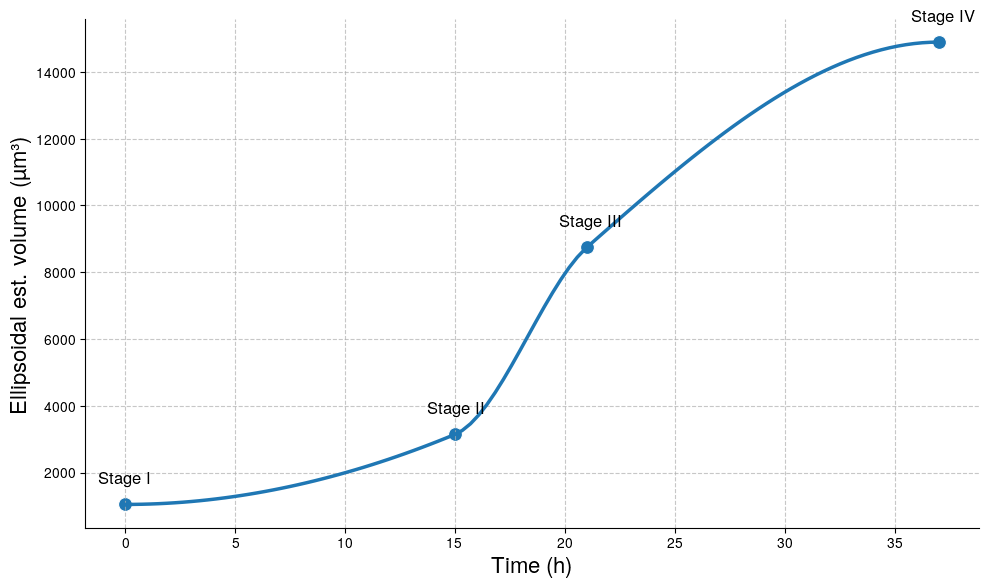

In [32]:
import seaborn as sns
from scipy.interpolate import PchipInterpolator

time = df['Time (h)'].values
volume = df['Ellipsoidal est. volume (µm³)'].values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=time, y=volume, s=100, color='#1f77b4')
for i, stage in enumerate(df['Stage']):
    plt.annotate(f'Stage {stage}', 
                 (time[i], volume[i]),
                 xytext=(-20, 15),  # Small offset from the point
                 textcoords='offset points',
                 fontsize=12,
                 fontweight='bold')

# Interpolate using a monotonic cubic spline
x_smooth = np.linspace(time.min(), time.max(), 100)
pchip = PchipInterpolator(time, volume) 
y_smooth = pchip(x_smooth)
plt.plot(x_smooth, y_smooth, '-', color='#1f77b4', linewidth=2.5)
plt.xlabel('Time (h)', fontsize=16)
plt.ylabel('Ellipsoidal est. volume (µm³)', fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
sns.despine()
plt.tight_layout()
fig = plt.gcf() 
save_fig(fig, f'{ZENODO_PATH}/Figure_S14/PhII_figureS14', exts=['pdf'])
fig

In [23]:
tv_df = pd.read_csv(f'{DATA_PATH}/topview/all_polygon_metrics.raw.csv')
tv_df = tv_df.drop(columns=['Spheroid'])
tv_df = tv_df.groupby('Stage').mean()
tv_df = tv_df[['Compartment major axis', 'Compartment minor axis']]
tv_df

,Compartment major axis,Compartment minor axis
Stage,,
I,9.332396,7.777429
II,16.319510,13.513973
III,18.701696,15.402049
IV,29.874193,25.179294
S,18.422740,15.776275


# Figure S15

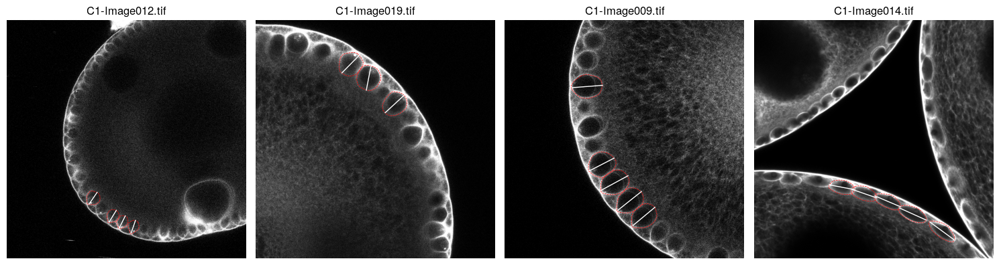

Saved figure to ../figures/PhII_figureS15_new.png


In [17]:
from microseg.utils.image import rescale_intensity
fig, axs = plt.subplots(1, 4, figsize=(15, 5))
for i, (ax, path) in enumerate(zip(axs, paths)):
    img = rescale_intensity(load_XY_image(path))
    ax.imshow(img, cmap='gray')
    ax.set_title(f'{os.path.basename(path)}')
    ax.axis('off')
    polys = [p.rescale(1/voxsizes[i]) for p in polygons[i]]
    pt.ax_planar_polygons(ax, polys, color='r', alpha=0., linewidth=0.5, linestyle='--')
    ellipses = [Ellipse.from_poly(p) for p in polys]
    pt.ax_ellipses(ax, ellipses, axes=True, major_axis_color='white', minor_axis_color='none', color='none')
plt.tight_layout()
plt.show()
save_fig(fig, f'{FIGS_PATH}/PhII_figureS15_new', exts=['png'])

# Table S3

In [20]:
df = pd.read_csv(f'{DATA_PATH}/topview/all_polygon_metrics.raw.csv')
df = df.drop(columns=['Spheroid'])
df = df.groupby('Stage').mean()
df

,Compartment AP value,Cell AP value,Voronoi AP value,Compartment area,Compartment perimeter,Compartment major axis,Major axis angle,Compartment minor axis,Voronoi Area,Cell area,...,Squared offset,Offset angle,Offset (whitened),Circular radius,Second moment,Second moment about cell,Voronoi error,Voronoi neighbors,Distance to center,Mahalanobis distance to center
Stage,,,,,,,,,,,,,,,,,,,,,
I,0.505497,0.505846,0.506206,57.954919,29.546061,9.332396,40.242950,7.777429,72.004307,26.709629,...,0.406255,42.806065,0.243525,4.215128,0.165712,0.172124,0.225939,6.015974,52.627129,0.489851
II,0.455129,0.455519,0.455442,175.070867,51.042688,16.319510,42.359939,13.513973,224.002779,48.465150,...,2.261953,45.377763,0.350251,7.379064,0.164556,0.176962,0.272148,5.972658,123.581231,0.551403
III,0.468201,0.468537,0.468715,227.509699,58.651017,18.701696,45.383478,15.402049,268.328893,49.618038,...,3.667832,45.556782,0.392035,8.414433,0.165657,0.181591,0.260323,5.977454,129.234094,0.527367
IV,0.476919,0.477456,0.477681,602.300324,93.754886,29.874193,47.549852,25.179294,822.300745,55.626897,...,8.477250,45.602078,0.370058,13.661346,0.163082,0.177293,0.308594,5.984236,223.208622,0.527702
S,0.460260,0.460644,0.460685,232.465135,59.176493,18.422740,39.126625,15.776275,322.350262,53.007478,...,2.124946,42.822037,0.274920,8.478870,0.163152,0.171365,0.295253,5.968877,143.739867,0.533580


# Figure S8

/Users/asrvsn/mambaforge/envs/volvox/lib/python3.10/site-packages/matplotlib/scale.py:253: RuntimeWarning: underflow encountered in power
  return np.power(self.base, a)
/Users/asrvsn/mambaforge/envs/volvox/lib/python3.10/site-packages/matplotlib/scale.py:253: RuntimeWarning: underflow encountered in power
  return np.power(self.base, a)
/Users/asrvsn/mambaforge/envs/volvox/lib/python3.10/site-packages/matplotlib/scale.py:253: RuntimeWarning: underflow encountered in power
  return np.power(self.base, a)


Saved uncompressed figure to ../zenodo/Figure_S8/PhII_figureS8.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S8/PhII_figureS8.pdf
Saved figure to ../zenodo/Figure_S8/PhII_figureS8.pdf


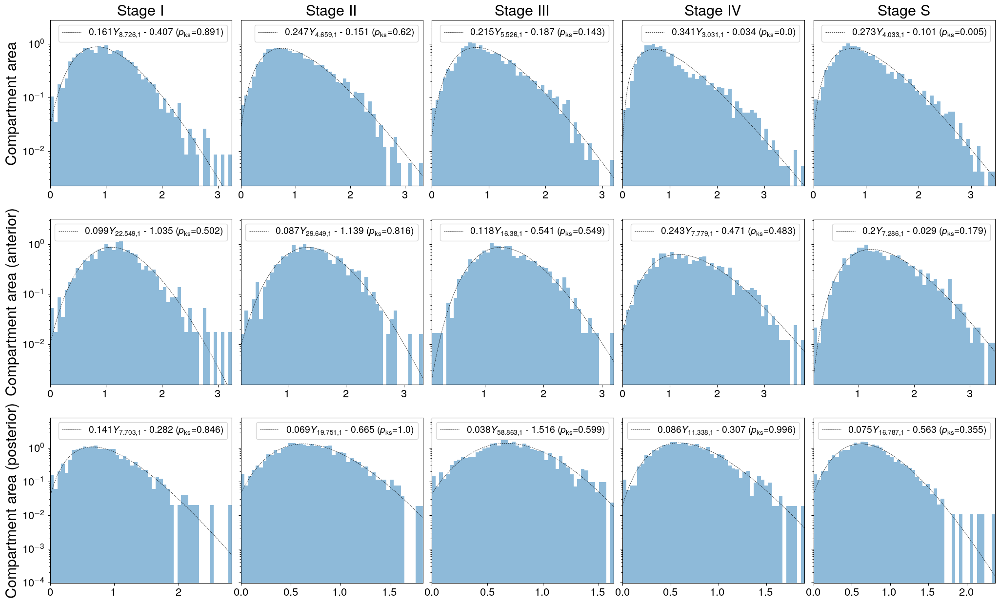

In [18]:
from plot_metrics import plot_metrics_rvs
from scipy import stats
fig, axs, datasource = plot_metrics_rvs([('Compartment area', None), ('Compartment area', 'anterior'), ('Compartment area', 'posterior')], rvs=[stats.gamma], sharey='row', pvalue_statistic='ks')
fig.subplots_adjust(wspace=0.05)
for ax in axs.flatten():
    pad_top_ax(ax, y_frac=0.02)
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_S8/PhII_figureS8', exts=['pdf'], dpi=150, autorasterize=False)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_S8/PhII_figureS8_data.csv', index=False)
fig

## Figure S9

/Users/asrvsn/mambaforge/envs/volvox/lib/python3.10/site-packages/matplotlib/scale.py:253: RuntimeWarning: underflow encountered in power
  return np.power(self.base, a)


Saved uncompressed figure to ../zenodo/Figure_S9/PhII_figureS9.uncompressed.pdf
Saved compressed figure to ../zenodo/Figure_S9/PhII_figureS9.pdf
Saved figure to ../zenodo/Figure_S9/PhII_figureS9.pdf


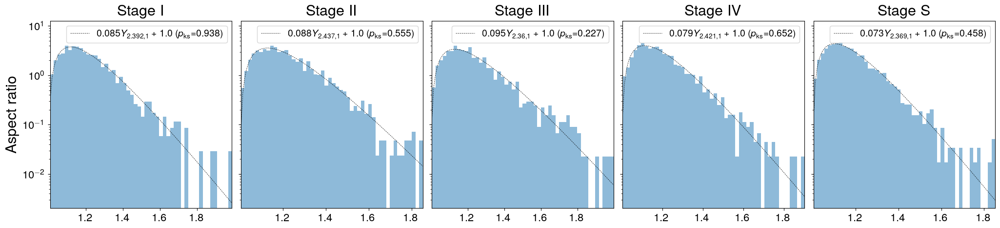

In [19]:
fig, axs, datasource = plot_metrics_rvs([('Aspect ratio', None)], rvs=[stats.gamma], sharey='row', pvalue_statistic='ks')
fig.subplots_adjust(wspace=0.05)
for ax in axs.flatten():
    pad_top_ax(ax, y_frac=0.015)
# 1. Save the figure
save_fig(fig, f'{ZENODO_PATH}/Figure_S9/PhII_figureS9', exts=['pdf'], dpi=150, autorasterize=False)
# 2. Export the data
datasource.to_csv(f'{ZENODO_PATH}/Figure_S9/PhII_figureS9_data.csv', index=False)
fig